# Capstone Project - Car Accident Severity Prediction (Week 2)
### Applied Data Science Capstone by IBM/Coursera

<img src="https://static01.nyt.com/images/2019/01/22/upshot/22up-traffic1/merlin_144908511_f611b394-7ae4-4e80-a860-9442f5b88656-superJumbo.jpg" width=800 height=200 align=center>

## Table of contents
* [Introduction: Business Problem](#intro)
* [Data](#data)
* [Visualization](#visualization)
* [Methodology](#method)
* [Analysis](#analysis)
* [Classification](#classification)
* [Results and Conclusion](#results)
<hr>

## Introduction: Business Problem <a name=intro></a>

Accidents in the **US** and around the world are a significant problem that increases the **fatality rate** of a country and also leads to **economic loss.

With the improvement in machine learning over recent years, it is essential that we study the effects of various attributes on roads and can effectively create a model that will allow us to predict accident severity. 

The input to such a model would be the characteristics of previous accidents such as **driver behavior, road conditions, road type, environmental conditions**, and the output vector would be the **class of accident severity**.

By building such a model, we would enable the drivers to have information about the severity of getting into a road accident if they kept driving on the route that they are on. **This extra piece of information** could make sure that the driver changes their style of driving on a particular route or change their course to avoid accidents and **potentially saving a life.** 

Therefore, **it is essential to invest in building a road accident severity prediction model.**

## Data <a name=data></a>

The data set that I will be using for this project is obtained from **coursera.org for Seattle city.**
This dataset has **194673 rows and 37 attributes** about the road and driver condition. 

Attributes such as: 
* Location 
* Road condition
* Weather condition 
* Junction junction
* Car speeding
* Number of people involved
* Light conditions
* The Number of vehicles involved in

are some of the attributes that can be used to create the model.
    
**The label of the data is present in the column Severity.** There are **unbalanced labels** present in the dataset which will need to be balanced in order to reduce the bias in the model.

*Now lets dive into the dataset and analyze the various attributes present in the dataset*

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# This allows us to display multiple outputs written in a single cell of the jupyter notebook. 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [2]:
df1 = pd.read_csv("Data-Collisions.csv")
df1.head()

C:\Users\Abdul Najeeb\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


Let us look at the shape, description, and info of the dataset to understand what type of data we have and how much of it do we have.

In [3]:
df1.shape
df1.describe()
df1.info()

(194673, 38)

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,INTKEY,SEVERITYCODE.1,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,SDOT_COLCODE,SDOTCOLNUM,SEGLANEKEY,CROSSWALKKEY
count,194673.000000,189339.000000,189339.000000,194673.000000,194673.000000,194673.000000,65070.000000,194673.000000,194673.000000,194673.000000,194673.000000,194673.000000,194673.000000,1.149360e+05,194673.000000,1.946730e+05
mean,1.298901,-122.330518,47.619543,108479.364930,141091.456350,141298.811381,37558.450576,1.298901,2.444427,0.037139,0.028391,1.920780,13.867768,7.972521e+06,269.401114,9.782452e+03
std,0.457778,0.029976,0.056157,62649.722558,86634.402737,86986.542110,51745.990273,0.457778,1.345929,0.198150,0.167413,0.631047,6.868755,2.553533e+06,3315.776055,7.226926e+04
min,1.000000,-122.419091,47.495573,1.000000,1001.000000,1001.000000,23807.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.007024e+06,0.000000,0.000000e+00
25%,1.000000,-122.348673,47.575956,54267.000000,70383.000000,70383.000000,28667.000000,1.000000,2.000000,0.000000,0.000000,2.000000,11.000000,6.040015e+06,0.000000,0.000000e+00
50%,1.000000,-122.330224,47.615369,106912.000000,123363.000000,123363.000000,29973.000000,1.000000,2.000000,0.000000,0.000000,2.000000,13.000000,8.023022e+06,0.000000,0.000000e+00
75%,2.000000,-122.311937,47.663664,162272.000000,203319.000000,203459.000000,33973.000000,2.000000,3.000000,0.000000,0.000000,2.000000,14.000000,1.015501e+07,0.000000,0.000000e+00
max,2.000000,-122.238949,47.734142,219547.000000,331454.000000,332954.000000,757580.000000,2.000000,81.000000,6.000000,2.000000,12.000000,69.000000,1.307202e+07,525241.000000,5.239700e+06


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 38 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   SEVERITYCODE    194673 non-null  int64  
 1   X               189339 non-null  float64
 2   Y               189339 non-null  float64
 3   OBJECTID        194673 non-null  int64  
 4   INCKEY          194673 non-null  int64  
 5   COLDETKEY       194673 non-null  int64  
 6   REPORTNO        194673 non-null  object 
 7   STATUS          194673 non-null  object 
 8   ADDRTYPE        192747 non-null  object 
 9   INTKEY          65070 non-null   float64
 10  LOCATION        191996 non-null  object 
 11  EXCEPTRSNCODE   84811 non-null   object 
 12  EXCEPTRSNDESC   5638 non-null    object 
 13  SEVERITYCODE.1  194673 non-null  int64  
 14  SEVERITYDESC    194673 non-null  object 
 15  COLLISIONTYPE   189769 non-null  object 
 16  PERSONCOUNT     194673 non-null  int64  
 17  PEDCOUNT  

Let us look at the value counts of the values present in each of these columns.

This will give us an idea of which columns we can drop from our analysis.

In [4]:
# Printing value counts for each column in the dataframe
for i in df1.columns:
    print(i)
    df1[i].value_counts()

SEVERITYCODE


1    136485
2     58188
Name: SEVERITYCODE, dtype: int64

X


-122.332653    265
-122.344896    254
-122.328079    252
-122.344997    239
-122.299160    231
              ... 
-122.322768      1
-122.288680      1
-122.405699      1
-122.323578      1
-122.343898      1
Name: X, Length: 23563, dtype: int64

Y


47.708655    265
47.717173    254
47.604161    252
47.725036    239
47.579673    231
            ... 
47.556705      1
47.709101      1
47.513899      1
47.565438      1
47.563521      1
Name: Y, Length: 23839, dtype: int64

OBJECTID


2047     1
1194     1
58550    1
64693    1
62644    1
        ..
96890    1
90745    1
92792    1
70263    1
2049     1
Name: OBJECTID, Length: 194673, dtype: int64

INCKEY


266238    1
81549     1
104088    1
126615    1
124566    1
         ..
164613    1
176899    1
178946    1
172801    1
295445    1
Name: INCKEY, Length: 194673, dtype: int64

COLDETKEY


266238    1
122129    1
111900    1
101659    1
99610     1
         ..
137750    1
131605    1
133652    1
143891    1
18441     1
Name: COLDETKEY, Length: 194673, dtype: int64

REPORTNO


1782439    2
1780512    2
1776526    2
2799509    1
C645505    1
          ..
3752617    1
2826195    1
3476864    1
3277856    1
E796154    1
Name: REPORTNO, Length: 194670, dtype: int64

STATUS


Matched      189786
Unmatched      4887
Name: STATUS, dtype: int64

ADDRTYPE


Block           126926
Intersection     65070
Alley              751
Name: ADDRTYPE, dtype: int64

INTKEY


29973.0    252
29933.0    160
29913.0    138
29549.0    136
33512.0    128
          ... 
36825.0      1
26604.0      1
26603.0      1
36816.0      1
27793.0      1
Name: INTKEY, Length: 7614, dtype: int64

LOCATION


BATTERY ST TUNNEL NB BETWEEN ALASKAN WY VI NB AND AURORA AVE N    276
BATTERY ST TUNNEL SB BETWEEN AURORA AVE N AND ALASKAN WY VI SB    271
N NORTHGATE WAY BETWEEN MERIDIAN AVE N AND CORLISS AVE N          265
AURORA AVE N BETWEEN N 117TH PL AND N 125TH ST                    254
6TH AVE AND JAMES ST                                              252
                                                                 ... 
49TH AVE S BETWEEN S GENESEE ST AND S OREGON ST                     1
S PLUM ST BETWEEN AIRPORT WAY S AND DEAD END 1                      1
16TH AVE SW AND SW ORCHARD ST                                       1
37TH AVE NE BETWEEN NE 68TH ST AND NE 70TH ST                       1
24TH PL NE BETWEEN NE 143RD ST AND DEAD END                         1
Name: LOCATION, Length: 24102, dtype: int64

EXCEPTRSNCODE


       79173
NEI     5638
Name: EXCEPTRSNCODE, dtype: int64

EXCEPTRSNDESC


Not Enough Information, or Insufficient Location Information    5638
Name: EXCEPTRSNDESC, dtype: int64

SEVERITYCODE.1


1    136485
2     58188
Name: SEVERITYCODE.1, dtype: int64

SEVERITYDESC


Property Damage Only Collision    136485
Injury Collision                   58188
Name: SEVERITYDESC, dtype: int64

COLLISIONTYPE


Parked Car    47987
Angles        34674
Rear Ended    34090
Other         23703
Sideswipe     18609
Left Turn     13703
Pedestrian     6608
Cycles         5415
Right Turn     2956
Head On        2024
Name: COLLISIONTYPE, dtype: int64

PERSONCOUNT


2     114231
3      35553
4      14660
1      13154
5       6584
0       5544
6       2702
7       1131
8        533
9        216
10       128
11        56
12        33
13        21
14        19
15        11
17        11
16         8
44         6
18         6
20         6
25         6
19         5
26         4
22         4
27         3
28         3
29         3
47         3
32         3
34         3
37         3
23         2
21         2
24         2
30         2
36         2
57         1
31         1
35         1
39         1
41         1
43         1
48         1
53         1
54         1
81         1
Name: PERSONCOUNT, dtype: int64

PEDCOUNT


0    187734
1      6685
2       226
3        22
4         4
6         1
5         1
Name: PEDCOUNT, dtype: int64

PEDCYLCOUNT


0    189189
1      5441
2        43
Name: PEDCYLCOUNT, dtype: int64

VEHCOUNT


2     147650
1      25748
3      13010
0       5085
4       2426
5        529
6        146
7         46
8         15
9          9
11         6
10         2
12         1
Name: VEHCOUNT, dtype: int64

INCDATE


2006/11/02 00:00:00+00    96
2008/10/03 00:00:00+00    92
2005/05/18 00:00:00+00    84
2005/11/05 00:00:00+00    83
2006/01/13 00:00:00+00    83
                          ..
2020/05/18 00:00:00+00     2
2020/05/17 00:00:00+00     1
2020/05/20 00:00:00+00     1
2015/12/25 00:00:00+00     1
2020/05/19 00:00:00+00     1
Name: INCDATE, Length: 5985, dtype: int64

INCDTTM


11/2/2006           96
10/3/2008           91
11/5/2005           83
12/4/2004           74
6/1/2006            73
                    ..
12/14/2016 15:36     1
12/19/2010 13:20     1
3/12/2019 17:00      1
1/6/2018 23:30       1
1/10/2018 22:28      1
Name: INCDTTM, Length: 162058, dtype: int64

JUNCTIONTYPE


Mid-Block (not related to intersection)              89800
At Intersection (intersection related)               62810
Mid-Block (but intersection related)                 22790
Driveway Junction                                    10671
At Intersection (but not related to intersection)     2098
Ramp Junction                                          166
Unknown                                                  9
Name: JUNCTIONTYPE, dtype: int64

SDOT_COLCODE


11    85209
14    54299
16     9928
0      9787
28     8856
24     6518
13     5852
26     4741
18     3104
15     1604
12     1440
51     1312
29      479
21      181
56      180
27      166
54      139
23      124
48      107
31      104
25      102
34       93
64       75
69       69
33       53
55       50
66       23
22       17
32       12
53        9
44        8
61        7
35        6
58        5
68        4
36        4
46        3
52        2
47        1
Name: SDOT_COLCODE, dtype: int64

SDOT_COLDESC


MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END AT ANGLE          85209
MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END                    54299
MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE SIDESWIPE          9928
NOT ENOUGH INFORMATION / NOT APPLICABLE                          9787
MOTOR VEHICLE RAN OFF ROAD - HIT FIXED OBJECT                    8856
MOTOR VEHCILE STRUCK PEDESTRIAN                                  6518
MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE AT ANGLE           5852
MOTOR VEHICLE STRUCK OBJECT IN ROAD                              4741
MOTOR VEHICLE STRUCK PEDALCYCLIST, FRONT END AT ANGLE            3104
MOTOR VEHICLE STRUCK MOTOR VEHICLE, RIGHT SIDE SIDESWIPE         1604
MOTOR VEHICLE STRUCK MOTOR VEHICLE, RIGHT SIDE AT ANGLE          1440
PEDALCYCLIST STRUCK MOTOR VEHICLE FRONT END AT ANGLE             1312
MOTOR VEHICLE OVERTURNED IN ROAD                                  479
MOTOR VEHICLE STRUCK PEDALCYCLIST, REAR END                       181
PEDALCYCLIST STRUCK 

INATTENTIONIND


Y    29805
Name: INATTENTIONIND, dtype: int64

UNDERINFL


N    100274
0     80394
Y      5126
1      3995
Name: UNDERINFL, dtype: int64

WEATHER


Clear                       111135
Raining                      33145
Overcast                     27714
Unknown                      15091
Snowing                        907
Other                          832
Fog/Smog/Smoke                 569
Sleet/Hail/Freezing Rain       113
Blowing Sand/Dirt               56
Severe Crosswind                25
Partly Cloudy                    5
Name: WEATHER, dtype: int64

ROADCOND


Dry               124510
Wet                47474
Unknown            15078
Ice                 1209
Snow/Slush          1004
Other                132
Standing Water       115
Sand/Mud/Dirt         75
Oil                   64
Name: ROADCOND, dtype: int64

LIGHTCOND


Daylight                    116137
Dark - Street Lights On      48507
Unknown                      13473
Dusk                          5902
Dawn                          2502
Dark - No Street Lights       1537
Dark - Street Lights Off      1199
Other                          235
Dark - Unknown Lighting         11
Name: LIGHTCOND, dtype: int64

PEDROWNOTGRNT


Y    4667
Name: PEDROWNOTGRNT, dtype: int64

SDOTCOLNUM


4116034.0     2
11200007.0    2
4112025.0     2
4116048.0     2
5036003.0     1
             ..
6262043.0     1
6162018.0     1
6277003.0     1
8267022.0     1
5071015.0     1
Name: SDOTCOLNUM, Length: 114932, dtype: int64

SPEEDING


Y    9333
Name: SPEEDING, dtype: int64

ST_COLCODE


32    27612
10    23427
14    16883
32    16809
10    11247
      ...  
87        1
60        1
85        1
54        1
43        1
Name: ST_COLCODE, Length: 115, dtype: int64

ST_COLDESC


One parked--one moving                                                 44421
Entering at angle                                                      34674
From same direction - both going straight - one stopped - rear-end     25771
Fixed object                                                           13554
From same direction - both going straight - both moving - sideswipe    12777
                                                                       ...  
Vehicle Strikes All Other Non-Domestic Animal                              2
Railway Vehicle Strikes Pedalcyclist                                       2
Vehicle Hits State Road or Construction Machinery                          1
Vehicle Strikes Deer                                                       1
Non-domestic animal (deer, bear, elk, etc)                                 1
Name: ST_COLDESC, Length: 62, dtype: int64

SEGLANEKEY


0         191907
6532          19
6078          16
12162         15
10336         14
           ...  
35157          1
10817          1
15043          1
525169         1
16376          1
Name: SEGLANEKEY, Length: 1955, dtype: int64

CROSSWALKKEY


0         190862
523609        17
520838        15
525567        13
521707        10
           ...  
521019         1
630862         1
25545          1
523322         1
27186          1
Name: CROSSWALKKEY, Length: 2198, dtype: int64

HITPARKEDCAR


N    187457
Y      7216
Name: HITPARKEDCAR, dtype: int64

After looking at the data we can drop few columns that we won't be needing for our analysis.
These columns are 
* **OBJECTID** (Doesn't add value towards predicting severity)
* **INCKEY** (Doesn't add value towards predicting severity)
* **COLDETKEY** (Doesn't add value towards predicting severity)
* **REPORTNO** (Doesn't add value towards predicting severity)
* **STATUS** (Doesn't add value towards predicting severity)
* **INTKEY** (Doesn't add value towards predicting severity)
* **LOCATION** (Many locations values to encode)
* **EXCEPTRSNCODE** (Too many missing values)
* **EXCEPTRSNDESC** (Too many missing values)
* **SEVERITYCODE.1** (Copy of column severity code)
* **INCDATE** (Doesn't add value towards predicting severity)
* **INCDTTM** (Doesn't add value towards predicting severity)
* **SDOT_COLDESC** (SDOT_COLCODE already has the encoded values of information present in this column)
* **INATTENTIONIND** (Doesn't add value towards predicting severity)
* **PEDROWNOTGRNT** (Doesn't add value towards predicting severity)
* **SDOTCOLNUM** (Doesn't add value towards predicting severity)
* **SPEEDING** (Too many missing values)
* **SEGLANEKEY** (Doesn't add value towards predicting severity)

In [5]:
# Lets drop the above discussed columns
df = df1.drop([
         'OBJECTID',
         'INCKEY',
         'COLDETKEY',
         'REPORTNO',
         'STATUS',
         'INTKEY',
         'LOCATION',
         'EXCEPTRSNCODE',
         'EXCEPTRSNDESC',
         'SEVERITYCODE.1',
        'INCDATE',
        'INCDTTM',
        'SDOT_COLDESC',
        'INATTENTIONIND',
        'PEDROWNOTGRNT',
        'SDOTCOLNUM',
        'SPEEDING',
        'SEGLANEKEY'],
        axis = 1)

Let us take a look at the dataset now

In [6]:
df.head()
df.shape

,SEVERITYCODE,X,Y,ADDRTYPE,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,JUNCTIONTYPE,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,ST_COLDESC,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,Intersection,Injury Collision,Angles,2,0,0,2,At Intersection (intersection related),11,N,Overcast,Wet,Daylight,10,Entering at angle,0,N
1,1,-122.347294,47.647172,Block,Property Damage Only Collision,Sideswipe,2,0,0,2,Mid-Block (not related to intersection),16,0,Raining,Wet,Dark - Street Lights On,11,From same direction - both going straight - bo...,0,N
2,1,-122.334540,47.607871,Block,Property Damage Only Collision,Parked Car,4,0,0,3,Mid-Block (not related to intersection),14,0,Overcast,Dry,Daylight,32,One parked--one moving,0,N
3,1,-122.334803,47.604803,Block,Property Damage Only Collision,Other,3,0,0,3,Mid-Block (not related to intersection),11,N,Clear,Dry,Daylight,23,From same direction - all others,0,N
4,2,-122.306426,47.545739,Intersection,Injury Collision,Angles,2,0,0,2,At Intersection (intersection related),11,0,Raining,Wet,Daylight,10,Entering at angle,0,N


(194673, 20)

Let us take a look at the number of values and **missing values** in each column

In [7]:
for i in df.columns:
    print(i)
    df[i].isna().sum()

SEVERITYCODE


0

X


5334

Y


5334

ADDRTYPE


1926

SEVERITYDESC


0

COLLISIONTYPE


4904

PERSONCOUNT


0

PEDCOUNT


0

PEDCYLCOUNT


0

VEHCOUNT


0

JUNCTIONTYPE


6329

SDOT_COLCODE


0

UNDERINFL


4884

WEATHER


5081

ROADCOND


5012

LIGHTCOND


5170

ST_COLCODE


18

ST_COLDESC


4904

CROSSWALKKEY


0

HITPARKEDCAR


0

Since we are not losing much data, we can drop the columns that have NA values.

In [8]:
df.dropna().shape
df.dropna(inplace = True)
df.reset_index(drop = True, inplace = True)

(180067, 20)

Let us take a look at the missing values now.

In [9]:
for i in df.columns:
    print(i)
    df[i].isna().sum()

SEVERITYCODE


0

X


0

Y


0

ADDRTYPE


0

SEVERITYDESC


0

COLLISIONTYPE


0

PERSONCOUNT


0

PEDCOUNT


0

PEDCYLCOUNT


0

VEHCOUNT


0

JUNCTIONTYPE


0

SDOT_COLCODE


0

UNDERINFL


0

WEATHER


0

ROADCOND


0

LIGHTCOND


0

ST_COLCODE


0

ST_COLDESC


0

CROSSWALKKEY


0

HITPARKEDCAR


0

## Visualization <a name=visualization></a>

In this section, we will be visualizing all of the attributes by plotting their **histograms**, and at the end of this visualization section we will display **10,000 location points** of the accidents on the **map of Seattle** in order to better understand the distribution of these accidents around the city

(array([124258.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,  55809.]),
 array([1. , 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. ]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'SEVERITY CODE')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'SEVERITYCODE Histogram')

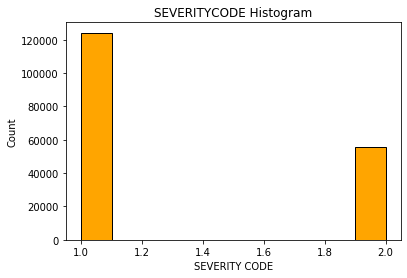

In [10]:
plt.hist(df.SEVERITYCODE, edgecolor = 'black', color = 'orange')
plt.xlabel("SEVERITY CODE")
plt.ylabel("Count")
plt.title("SEVERITYCODE Histogram")


(array([ 62982.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 117085.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'ADDRESS TYPE')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'ADDRTYPE Histogram')

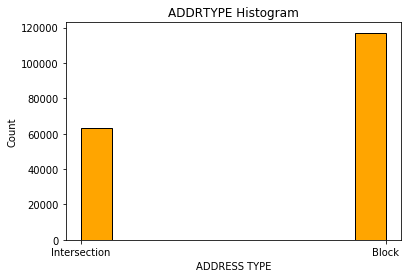

In [11]:
plt.hist(df.ADDRTYPE, edgecolor = 'black', color = 'orange')
plt.xlabel("ADDRESS TYPE")
plt.ylabel("Count")
plt.title("ADDRTYPE Histogram")

(array([ 55809.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 124258.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'SEVERITYDESC Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'SEVERITYDESC Histogram')

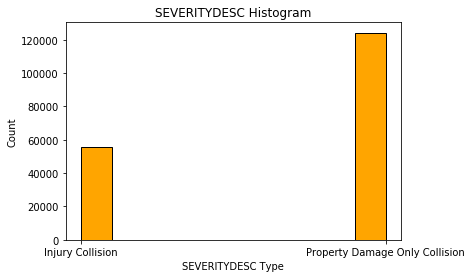

In [12]:
plt.hist(df.SEVERITYDESC, edgecolor = 'black', color = 'orange')
plt.xlabel("SEVERITYDESC Type")
plt.ylabel("Count")
plt.title("SEVERITYDESC Histogram")

(array([34353., 17862., 42886., 21907.,  5334., 32778.,  1979., 13586.,
         6481.,  2901.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <a list of 10 Patch objects>)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], <a list of 10 Text xticklabel objects>)

Text(0.5, 0, 'COLLISIONTYPE Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'COLLISIONTYPE Histogram')

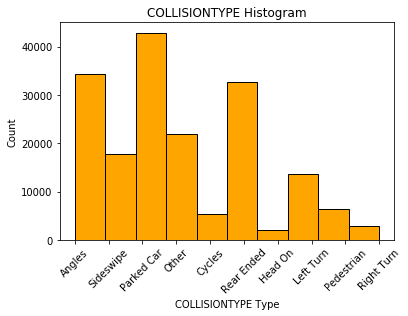

In [13]:
plt.hist(df.COLLISIONTYPE, edgecolor = 'black', color = 'orange')
plt.xticks(rotation = 45)
plt.xlabel("COLLISIONTYPE Type")
plt.ylabel("Count")
plt.title("COLLISIONTYPE Histogram")

(array([1.79504e+05, 4.76000e+02, 3.70000e+01, 2.40000e+01, 1.00000e+01,
        1.20000e+01, 2.00000e+00, 1.00000e+00, 0.00000e+00, 1.00000e+00]),
 array([ 0. ,  8.1, 16.2, 24.3, 32.4, 40.5, 48.6, 56.7, 64.8, 72.9, 81. ]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'PERSONCOUNT Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'PERSONCOUNT Histogram')

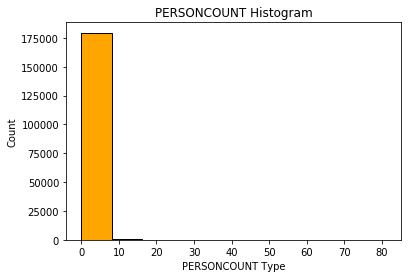

In [14]:
plt.hist(df.PERSONCOUNT, edgecolor = 'black', color = 'orange')
plt.xlabel("PERSONCOUNT Type")
plt.ylabel("Count")
plt.title("PERSONCOUNT Histogram")

(array([1.73259e+05, 6.55600e+03, 0.00000e+00, 2.24000e+02, 0.00000e+00,
        2.20000e+01, 4.00000e+00, 0.00000e+00, 1.00000e+00, 1.00000e+00]),
 array([0. , 0.6, 1.2, 1.8, 2.4, 3. , 3.6, 4.2, 4.8, 5.4, 6. ]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'PEDCOUNT Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'PEDCOUNT Histogram')

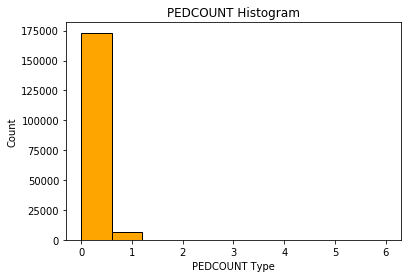

In [15]:
plt.hist(df.PEDCOUNT, edgecolor = 'black', color = 'orange')
plt.xlabel("PEDCOUNT Type")
plt.ylabel("Count")
plt.title("PEDCOUNT Histogram")

(array([1.7468e+05, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        5.3460e+03, 0.0000e+00, 0.0000e+00, 0.0000e+00, 4.1000e+01]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'PEDCYLCOUNT Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'PEDCYLCOUNT Histogram')

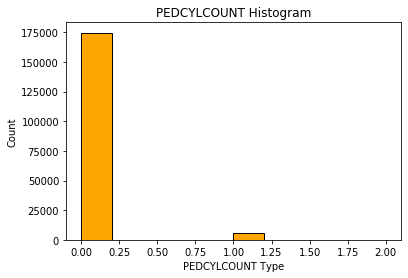

In [16]:
plt.hist(df.PEDCYLCOUNT, edgecolor = 'black', color = 'orange')
plt.xlabel("PEDCYLCOUNT Type")
plt.ylabel("Count")
plt.title("PEDCYLCOUNT Histogram")

(array([2.4321e+04, 1.4001e+05, 1.2635e+04, 2.3670e+03, 5.1800e+02,
        1.8400e+02, 1.5000e+01, 9.0000e+00, 2.0000e+00, 6.0000e+00]),
 array([ 0. ,  1.2,  2.4,  3.6,  4.8,  6. ,  7.2,  8.4,  9.6, 10.8, 12. ]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'VEHCOUNT Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'VEHCOUNT Histogram')

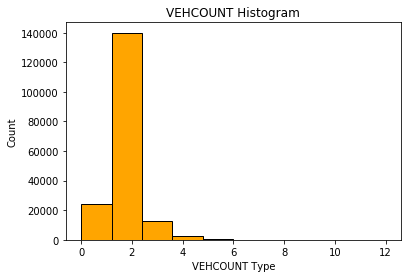

In [17]:
plt.hist(df.VEHCOUNT, edgecolor = 'black', color = 'orange')
plt.xlabel("VEHCOUNT Type")
plt.ylabel("Count")
plt.title("VEHCOUNT Histogram")

(array([6.0915e+04, 8.4513e+04, 0.0000e+00, 1.0430e+04, 0.0000e+00,
        2.0300e+03, 2.2035e+04, 0.0000e+00, 1.3900e+02, 5.0000e+00]),
 array([0. , 0.6, 1.2, 1.8, 2.4, 3. , 3.6, 4.2, 4.8, 5.4, 6. ]),
 <a list of 10 Patch objects>)

([0, 1, 2, 3, 4, 5, 6], <a list of 7 Text xticklabel objects>)

Text(0.5, 0, 'JUNCTIONTYPE Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'JUNCTIONTYPE Histogram')

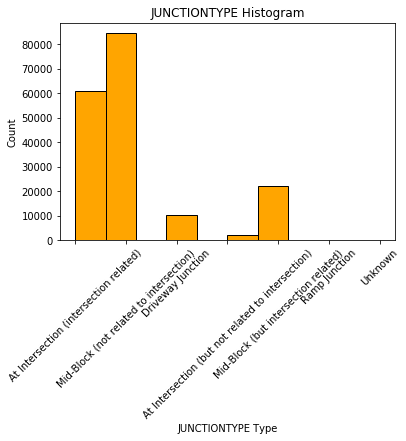

In [18]:
plt.hist(df.JUNCTIONTYPE, edgecolor = 'black', color = 'orange')
plt.xticks(rotation = 45)
plt.xlabel("JUNCTIONTYPE Type")
plt.ylabel("Count")
plt.title("JUNCTIONTYPE Histogram")

(array([93736.,     0.,     0., 77514.,     0.,     0.,  3878.,     0.,
            0.,  4939.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'UNDERINFL Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'UNDERINFL Histogram')

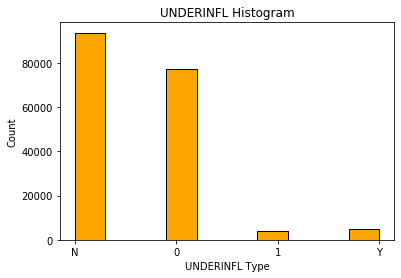

In [19]:
plt.hist(df.UNDERINFL, edgecolor = 'black', color = 'orange')
plt.xlabel("UNDERINFL Type")
plt.ylabel("Count")
plt.title("UNDERINFL Histogram")

(array([2.68090e+04, 3.17190e+04, 1.07692e+05, 1.15050e+04, 7.28000e+02,
        8.75000e+02, 5.49000e+02, 1.12000e+02, 4.90000e+01, 2.90000e+01]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <a list of 10 Patch objects>)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], <a list of 11 Text xticklabel objects>)

Text(0.5, 0, 'WEATHER Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'WEATHER Histogram')

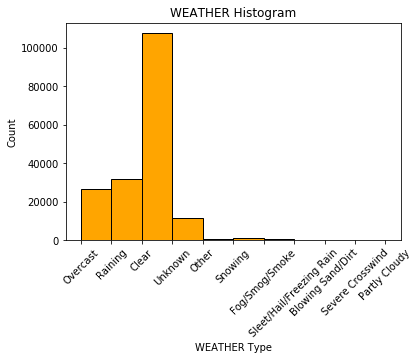

In [20]:
plt.hist(df.WEATHER, edgecolor = 'black', color = 'orange')
plt.xticks(rotation = 45)
plt.xlabel("WEATHER Type")
plt.ylabel("Count")
plt.title("WEATHER Histogram")

(array([4.55970e+04, 1.20629e+05, 1.13840e+04, 9.71000e+02, 0.00000e+00,
        1.16100e+03, 1.15000e+02, 6.20000e+01, 9.90000e+01, 4.90000e+01]),
 array([0. , 0.8, 1.6, 2.4, 3.2, 4. , 4.8, 5.6, 6.4, 7.2, 8. ]),
 <a list of 10 Patch objects>)

([0, 1, 2, 3, 4, 5, 6, 7, 8], <a list of 9 Text xticklabel objects>)

Text(0.5, 0, 'ROADCOND Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'ROADCOND Histogram')

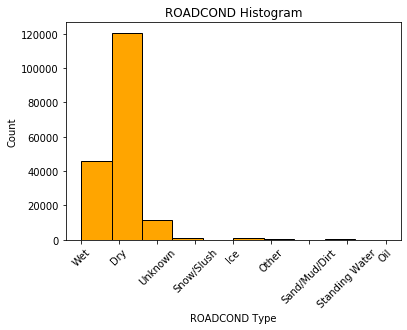

In [21]:
plt.hist(df.ROADCOND, edgecolor = 'black', color = 'orange')
plt.xticks(rotation = 45)
plt.xlabel("ROADCOND Type")
plt.ylabel("Count")
plt.title("ROADCOND Histogram")

<Figure size 576x288 with 0 Axes>

(array([1.12216e+05, 4.66830e+04, 1.41800e+03, 1.03400e+04, 0.00000e+00,
        5.70800e+03, 2.38900e+03, 1.13000e+03, 1.72000e+02, 1.10000e+01]),
 array([0. , 0.8, 1.6, 2.4, 3.2, 4. , 4.8, 5.6, 6.4, 7.2, 8. ]),
 <a list of 10 Patch objects>)

([0, 1, 2, 3, 4, 5, 6, 7, 8], <a list of 9 Text xticklabel objects>)

Text(0.5, 0, 'LIGHTCOND Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'LIGHTCOND Histogram')

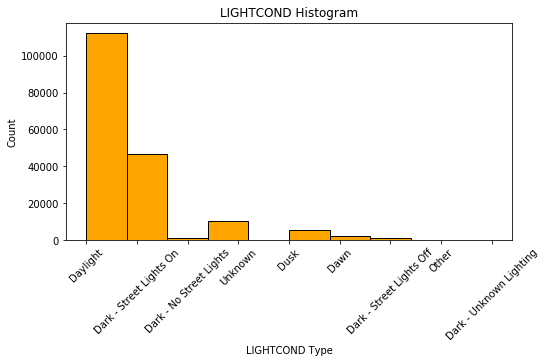

In [22]:
plt.figure(figsize= (8,4))
plt.hist(df.LIGHTCOND, edgecolor = 'black', color = 'orange')
plt.xticks(rotation = 45)
plt.xlabel("LIGHTCOND Type")
plt.ylabel("Count")
plt.title("LIGHTCOND Histogram")

(array([1.78817e+05, 1.24900e+03, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00]),
 array([      0.,  523970., 1047940., 1571910., 2095880., 2619850.,
        3143820., 3667790., 4191760., 4715730., 5239700.]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'CROSSWALKKEY Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'CROSSWALKKEY Histogram')

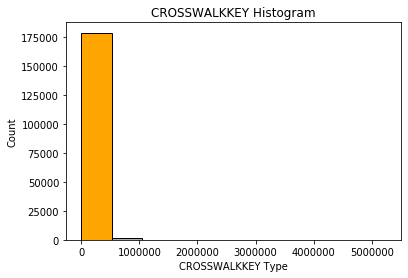

In [23]:
plt.hist(df.CROSSWALKKEY, edgecolor = 'black', color = 'orange')
plt.xlabel("CROSSWALKKEY Type")
plt.ylabel("Count")
plt.title("CROSSWALKKEY Histogram")

(array([174386.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,   5681.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

Text(0.5, 0, 'HITPARKEDCAR Type')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'HITPARKEDCAR Histogram')

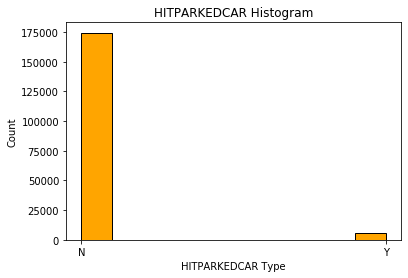

In [24]:
plt.hist(df.HITPARKEDCAR, edgecolor = 'black', color = 'orange')
plt.xlabel("HITPARKEDCAR Type")
plt.ylabel("Count")
plt.title("HITPARKEDCAR Histogram")

Next, let us use the folium package in python to visualize the points of the accidents using the location data present in our dataset. 

The **folium package** would crash when trying to display all the location data points present in our dataset; therefore, I choose to display only 10,000 data points.

In [25]:
# Mapping the accidents on the map of seattle using folium 
import folium
from folium import plugins

# let's start with a clean copy of the map of Seattle
seattle_map = folium.Map(location = [47.6062,-122.3321,], zoom_start = 9)

# Instantiate a mark cluster object for the incidents in the dataframe 
# This allows for us to look at the accidents as a cluster instead of several points which we cannot discern properly
incidents = plugins.MarkerCluster().add_to(seattle_map)

# Loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df.Y[:10000], df.X[:10000], df.SEVERITYCODE):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# Display map
seattle_map

The cluster map of the data points shows us that the most number of accidents occur near the **International District/Chinatown** area and close to **Georgetown** area where the **airport** resides, this makes sense since the most traffic in a city is expected to be around these areas.

## Methodology<a name=method></a>

In order to store the dataset, I used my local machine. The master data consists of all the attributes present in the dataset, and we aim to use the 20 attributes that we have assembled in our data frame, as discussed above.

We use the **folium** library order to visualize the geographic details of the accidents around the city of Seattle. I created a map of the accidents around the city of Seattle to understand the areas most affected by accidents.

We use **pandas** and **matplotlib** libraries to analyze our dataset and see for cases of:

* *Missing values* 
* *NA values* 
* *Types of values present in each dataset*
* *Transformation of these attributes into our desired format for the machine learning process*

We were able to find that there is a class imbalance present in our dataset, which should hopefully not affect our models severely. So we decide to proceed further.

In this project, I plan to use four models for the dataset they are:
* *K Nearest Neighbors*
* *Decision Tree*
* *Logistic Regression* 
* *Support Vector Machine*

The results obtained from running these models on the dataset will be summarized at the end of this notebook.


## Analysis <a name=analysis></a>

The Analysis part is the section of this notebook where we perform **transformations** on our dataset and enable it for proper use with our **machine learning models**. We will go through the following steps during the Analysis phase:

* [Data Preprocessing](#DataPre)
* [Data Normalization](#DataNorm)
* [Train and Testing Data Split](#TrainTest)


### Data Preporcessing <a name="DataPre"></a>

In this section, we focus on the attributes that have the type object present in them and try to convert them to a numeric format by using **Label Encoder** present in the **scikit-learn package.**

In [26]:
# Creating a copy of our original dataset
df2 = df[:]

We drop the location points from our dataset since we don't need them for training our machine learning models.

In [27]:
# Dropping X and Y attributes
df2.drop(["X","Y"], 
         axis = 1,
         inplace = True)
df2.head()

C:\Users\Abdul Najeeb\Anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,SEVERITYCODE,ADDRTYPE,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,JUNCTIONTYPE,SDOT_COLCODE,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,ST_COLCODE,ST_COLDESC,CROSSWALKKEY,HITPARKEDCAR
0,2,Intersection,Injury Collision,Angles,2,0,0,2,At Intersection (intersection related),11,N,Overcast,Wet,Daylight,10,Entering at angle,0,N
1,1,Block,Property Damage Only Collision,Sideswipe,2,0,0,2,Mid-Block (not related to intersection),16,0,Raining,Wet,Dark - Street Lights On,11,From same direction - both going straight - bo...,0,N
2,1,Block,Property Damage Only Collision,Parked Car,4,0,0,3,Mid-Block (not related to intersection),14,0,Overcast,Dry,Daylight,32,One parked--one moving,0,N
3,1,Block,Property Damage Only Collision,Other,3,0,0,3,Mid-Block (not related to intersection),11,N,Clear,Dry,Daylight,23,From same direction - all others,0,N
4,2,Intersection,Injury Collision,Angles,2,0,0,2,At Intersection (intersection related),11,0,Raining,Wet,Daylight,10,Entering at angle,0,N


Let us use the **LabelEncoder** present in the **Scikit_Learn** library to convert categorical variables into numerical labels

In [28]:
# Looking at the data type of each column
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180067 entries, 0 to 180066
Data columns (total 18 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   SEVERITYCODE   180067 non-null  int64 
 1   ADDRTYPE       180067 non-null  object
 2   SEVERITYDESC   180067 non-null  object
 3   COLLISIONTYPE  180067 non-null  object
 4   PERSONCOUNT    180067 non-null  int64 
 5   PEDCOUNT       180067 non-null  int64 
 6   PEDCYLCOUNT    180067 non-null  int64 
 7   VEHCOUNT       180067 non-null  int64 
 8   JUNCTIONTYPE   180067 non-null  object
 9   SDOT_COLCODE   180067 non-null  int64 
 10  UNDERINFL      180067 non-null  object
 11  WEATHER        180067 non-null  object
 12  ROADCOND       180067 non-null  object
 13  LIGHTCOND      180067 non-null  object
 14  ST_COLCODE     180067 non-null  object
 15  ST_COLDESC     180067 non-null  object
 16  CROSSWALKKEY   180067 non-null  int64 
 17  HITPARKEDCAR   180067 non-null  object
dtypes: i

In [29]:
# Converting ST_COLCODE to type INT
df2["ST_COLCODE"] = df2["ST_COLCODE"].astype("int")

C:\Users\Abdul Najeeb\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [30]:
from sklearn.preprocessing import LabelEncoder

# Creating a label encoder object
encoder = LabelEncoder()

# Using label encoder to create columns in the dataframe that have encoded labels
df2["ADDRTYPE_ENCODED"] = encoder.fit_transform(df2["ADDRTYPE"])
df2["SEVERITYDESC_ENCODED"] = encoder.fit_transform(df2["SEVERITYDESC"])
df2["COLLISIONTYPE_ENCODED"] = encoder.fit_transform(df2["COLLISIONTYPE"])
df2["JUNCTIONTYPE_ENCODED"] = encoder.fit_transform(df2["JUNCTIONTYPE"])
df2["UNDERINFL_ENCODED"] = encoder.fit_transform(df2["UNDERINFL"])
df2["WEATHER_ENCODED"] = encoder.fit_transform(df2["WEATHER"])
df2["ROADCOND_ENCODED"] = encoder.fit_transform(df2["ROADCOND"])
df2["LIGHTCOND_ENCODED"] = encoder.fit_transform(df2["LIGHTCOND"])
df2["ST_COLDESC_ENCODED"] = encoder.fit_transform(df2["ST_COLDESC"])
df2["HITPARKEDCAR_ENCODED"] = encoder.fit_transform(df2["HITPARKEDCAR"])

# Dropping the OBJECT type columns from our dataset
df2.drop(["ADDRTYPE","SEVERITYDESC", "COLLISIONTYPE", "JUNCTIONTYPE", "UNDERINFL", "WEATHER", "ROADCOND", "LIGHTCOND", "ST_COLDESC","HITPARKEDCAR"], axis = 1, inplace = True)

C:\Users\Abdul Najeeb\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


Let us take a look at the Data Columns again

In [31]:
# Looking at the data type of each column
df2.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180067 entries, 0 to 180066
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype
---  ------                 --------------   -----
 0   SEVERITYCODE           180067 non-null  int64
 1   PERSONCOUNT            180067 non-null  int64
 2   PEDCOUNT               180067 non-null  int64
 3   PEDCYLCOUNT            180067 non-null  int64
 4   VEHCOUNT               180067 non-null  int64
 5   SDOT_COLCODE           180067 non-null  int64
 6   ST_COLCODE             180067 non-null  int32
 7   CROSSWALKKEY           180067 non-null  int64
 8   ADDRTYPE_ENCODED       180067 non-null  int32
 9   SEVERITYDESC_ENCODED   180067 non-null  int32
 10  COLLISIONTYPE_ENCODED  180067 non-null  int32
 11  JUNCTIONTYPE_ENCODED   180067 non-null  int32
 12  UNDERINFL_ENCODED      180067 non-null  int32
 13  WEATHER_ENCODED        180067 non-null  int32
 14  ROADCOND_ENCODED       180067 non-null  int32
 15  LIGHTCOND_ENCODED

To use **scikit-learn library**, we have to convert the **Pandas** data frame to a **Numpy array**:

In [32]:
# Creating X numpy array with attributes data and converting it to float
X = df2[df2.columns[1:]].values.astype(float)
X[0:5]

array([[ 2.,  0.,  0.,  2., 11., 10.,  0.,  1.,  0.,  0.,  1.,  2.,  4.,
         8.,  5.,  4.,  0.],
       [ 2.,  0.,  0.,  2., 16., 11.,  0.,  0.,  1.,  9.,  4.,  0.,  6.,
         8.,  2., 16.,  0.],
       [ 4.,  0.,  0.,  3., 14., 32.,  0.,  0.,  1.,  5.,  4.,  0.,  4.,
         0.,  5., 27.,  0.],
       [ 3.,  0.,  0.,  3., 11., 23.,  0.,  0.,  1.,  4.,  4.,  2.,  1.,
         0.,  5., 14.,  0.],
       [ 2.,  0.,  0.,  2., 11., 10.,  0.,  1.,  0.,  0.,  1.,  0.,  6.,
         8.,  5.,  4.,  0.]])

In [33]:
# Creating y numpy array with target label data and converting it to float
y = df2[df2.columns[0]].values
y[0:5]

array([2, 1, 1, 1, 2], dtype=int64)

### Data Normalization <a name="DataNorm"></a>

Since the range of values present in our dataset is high, we need to normalize this data before it can be used in machine learning models. We use **Standard Scalar** from the **scikit-learn** library in order to normalize our dataset. 

In [34]:
from sklearn import preprocessing

# Normalizing the Array using STANDARD SCALAR
X = preprocessing.StandardScaler().fit(X).transform(X.astype(float))
X[0:5]

array([[-0.35018524, -0.19318067, -0.17494156,  0.04553381, -0.51435983,
        -0.86159741, -0.13930458,  1.36346002, -1.49214167, -1.58156601,
        -1.23626698,  0.83855411,  0.38186893,  1.51235645,  0.39009757,
        -1.12180172, -0.18049143],
       [-0.35018524, -0.19318067, -0.17494156,  0.04553381,  0.25937177,
        -0.79267107, -0.13930458, -0.73342818,  0.67017765,  1.60474864,
         0.94199277, -1.1228522 ,  1.11443158,  1.51235645, -1.4110537 ,
        -0.2021261 , -0.18049143],
       [ 1.11073119, -0.19318067, -0.17494156,  1.8310602 , -0.05012087,
         0.65478203, -0.13930458, -0.73342818,  0.67017765,  0.18860879,
         0.94199277, -1.1228522 ,  0.38186893, -0.69098882,  0.39009757,
         0.6409099 , -0.18049143],
       [ 0.38027298, -0.19318067, -0.17494156,  1.8310602 , -0.51435983,
         0.03444499, -0.13930458, -0.73342818,  0.67017765, -0.16542617,
         0.94199277,  0.83855411, -0.71697504, -0.69098882,  0.39009757,
        -0.35540537

### Training and Testing Data Split <a name="TrainTest"></a>

This is the last part of the analysis in this part we **split our dataset into training or testing dataset**, we divide the datset such that we have **65%** of the dataset for **training** and we use the rest **35%** for **testing.** 

In [35]:
from sklearn.model_selection import train_test_split

# Using train_test_split to split the dataset
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.35, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (117043, 17) (117043,)
Test set: (63024, 17) (63024,)


Now our dataset is finally cleaned up and divided into proper training and testing datasets, we can use this data onto out machine learning models now. 

## Classification <a name=classification></a>

After succesffully transforming our dataset in the above sections we can now finally use it in our machine learning models as discussed above we will be using 4 algorithms for our analysis. 

### K Nearest neighbor (KNN)

In [36]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

# We use 10 K values for our analysis and then select the best one out of al
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    #Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
    yhat=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat)

    
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])

mean_acc

array([0.99933359, 0.99904798, 0.99904798, 0.99903211, 0.99903211,
       0.99906385, 0.99887345, 0.99882584, 0.99858784])

Text(0, 0.5, 'Accuracy ')

Text(0.5, 0, 'Number of Neighbors (K)')

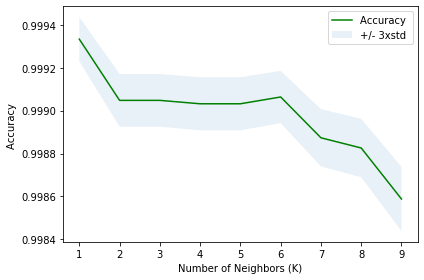

In [37]:
# Plotting the accuracies obtained by each value of K and it's standard deviation
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

We see that k = 7 gives us the best accuracy but since we know that there are only two options in our target variable we use K = 2 for our final modee. 

In [38]:
# Fitting on the training data and making predictions on the test set
KNN2 = KNeighborsClassifier(n_neighbors = 2).fit(X_train,y_train)
KNNPred = KNN2.predict(X_test)

In [39]:
# Comparing first 20 predictions with our test set 
KNNPred [0:20]
y_test [0:20]

array([1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1],
      dtype=int64)

array([1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1],
      dtype=int64)

### Decision Tree

In [40]:
from sklearn.tree import DecisionTreeClassifier

# Creating the Decision Tree Model
severityTree = DecisionTreeClassifier(criterion = "entropy", max_depth = 6)

# Fitting on the training data and making predictions on the test set
severityTree.fit(X_train, y_train)
predTree = severityTree.predict(X_test)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=6, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [41]:
# Comparing first 20 predictions with our test set
predTree [0:20]
y_test [0:20]

array([1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1],
      dtype=int64)

array([1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1],
      dtype=int64)

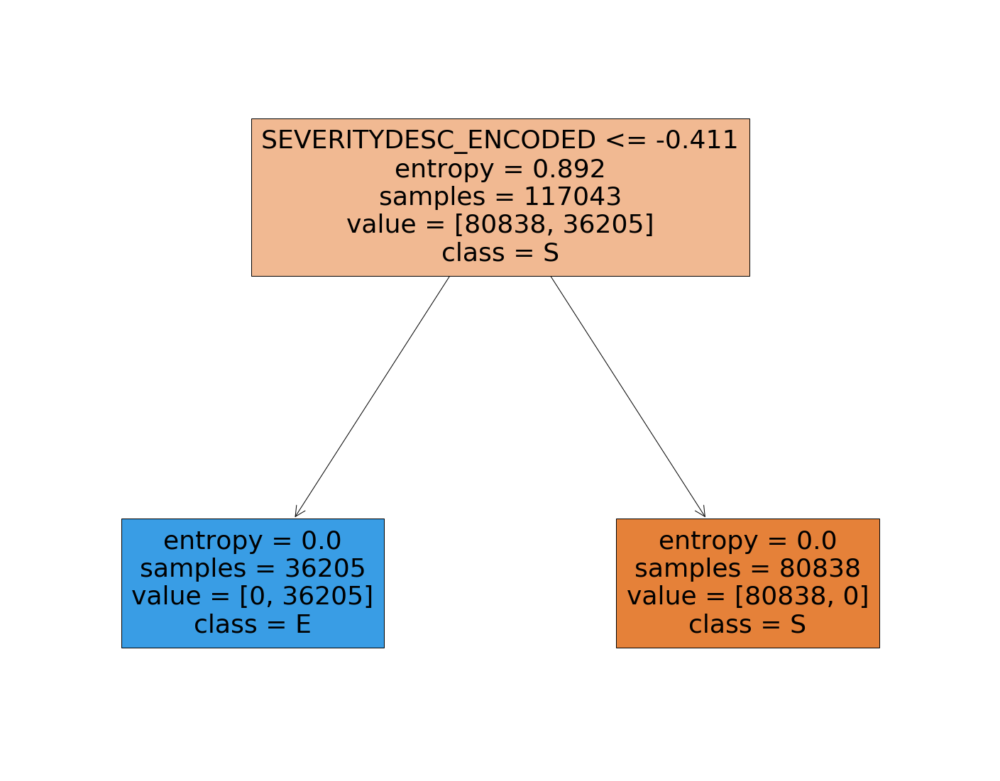

In [42]:
# Visualizing the tree
from sklearn import tree
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(severityTree, 
                   feature_names=df2.columns[1:],  
                   class_names=df2.columns[0],
                   filled=True)

In [43]:
print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y_test, predTree))

DecisionTrees's Accuracy:  1.0


### Support Vector Machine

In [44]:
from sklearn import svm
svm_model = svm.SVC(kernel = 'rbf')

# Fitting on the training data and making predictions on the test set
svm_model.fit(X_train, y_train)
yhat = svm_model.predict(X_test)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [45]:
# Comparing first 20 predictions with our test set

yhat[0:20]
y_test [0:20]

array([1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1],
      dtype=int64)

array([1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1],
      dtype=int64)

In [46]:
print("SVM's Accuracy: ", metrics.accuracy_score(y_test, yhat))

SVM's Accuracy:  0.9998889312008123


### Logistic Regression

In [47]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression(C = 0.01, solver = 'liblinear')

# Fitting on the training data and making predictions on the test set
LR.fit(X_train, y_train)
yhat1 = LR.predict(X_test)

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [48]:
# Comparing first 20 predictions with our test set

yhat1[0:20]
y_test[0:20]

array([1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1],
      dtype=int64)

array([1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1],
      dtype=int64)

In [49]:
print("Logistic Regressions Accuracy: ", metrics.accuracy_score(y_test, yhat1))

Logistic Regressions Accuracy:  1.0


## Results and Conclusion <a name=results></a>

For discussing the results and conclusion of this project we will go through 4 main metrics calculated over the models these metrics are as follows: 
* *Accuracy*
* *Jaccard Similarity Score*
* *F1 Score*
* *Log_loss (Only for Logistic Regression)

In [50]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss

Let us create and evaluation table for the 4 models we have used and compare their **accuracy, jaccard score, f1 score, and log loss.**

In [51]:
# Creating a for loop to measure the metrics for each of our model and storing them in a dictionary called evaluation
models = [KNN2, severityTree, svm_model, LR]
evaluation = {}
for i in models:
    yhat = i.predict(X_test)
    if i == LR:
        yhat2 = i.predict_proba(X_test)
        evaluation[i] = [accuracy_score(y_test,yhat),
                         jaccard_similarity_score(y_test,yhat),
                         f1_score(y_test,yhat, average = 'weighted'),
                        log_loss(y_test, yhat2)]
    else:
        evaluation[i] = [accuracy_score(y_test,yhat),
                         jaccard_similarity_score(y_test,yhat),
                         f1_score(y_test,yhat, average = 'weighted'),
                         'NA']


C:\Users\Abdul Najeeb\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)
C:\Users\Abdul Najeeb\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)
C:\Users\Abdul Najeeb\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)
C:\Users\Abdul N

In [52]:
# Creating a dataframe out of the dataframe evaluation
evaluation = pd.DataFrame(evaluation).transpose()
algorithm = ["KNN", "Decision Tree", "SVM", "LogisticRegression"]
evaluation.insert (0, "Algorithm", algorithm)
evaluation.reset_index(drop=True, inplace=True)
evaluation.columns = ['Algorithm', 'Accuracy', 'Jaccard', 'F1-score', 'LogLoss']

In [53]:
print("Evaluation Table")
evaluation

Evaluation Table


,Algorithm,Accuracy,Jaccard,F1-score,LogLoss
0,KNN,0.999048,0.999048,0.999048,NA
1,Decision Tree,1,1,1,NA
2,SVM,0.999889,0.999889,0.999889,NA
3,LogisticRegression,1,1,1,0.00456606


From the above-given evaluation table it is easy to see that although all of our algorithms performed substantially well on the dataset, the two best algorithms for predicting accident severity are **Decision Tree classifier** and **Logistic Regression** model